<a href="https://colab.research.google.com/github/Prajwal270/Tensorflow-Implementation/blob/master/Convolution_basic.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
print('Convolution Basic')

Convolution Basic


### Convolution: 1D operation with Python (Numpy/Scipy)

In [0]:
import numpy as np


## There are three methods to apply kernel on the matrix :

1. With Padding(full)
2. With Padding(same)
3. Without Padding(valid)

In [0]:
#Definig the image and kernel 


h = [3,8,5,3,2] # Image
x = [2,6,7] # Kernel

In [9]:
# Convolution Operation With Padding (full)

y = np.convolve(x,h) # default value is full (or) we can even specify 'full'
print(y)

[ 6 34 79 92 57 33 14]


In [10]:
# Convolution Operation With Padding (Same)
y2 = np.convolve(x,h,'same')
y2

array([34, 79, 92, 57, 33])

In [11]:
y3 = np.convolve(x, h ,'valid')
y3

array([79, 92, 57])

### Convolution: 2D operation with Python (Numpy/Scipy)

In [0]:
# Defining Sample Image and Kernel

I = [[2,3,4],
     [6,4,2],
     [9,6,7],] # Image

k =[[-1, 2]] # Kernel    

In [19]:
# Convolution Operation (full)
from scipy import signal as sg

y1 = sg.convolve(I, k, 'full')
y1 

array([[-2,  1,  2,  8],
       [-6,  8,  6,  4],
       [-9, 12,  5, 14]])

In [20]:
y2 = sg.convolve(I, k, 'same')
y2

array([[-2,  1,  2],
       [-6,  8,  6],
       [-9, 12,  5]])

In [21]:
y3 = sg.convolve(I, k, 'valid')
y3

array([[ 1,  2],
       [ 8,  6],
       [12,  5]])

In [25]:
I= [[255,   7,  3],
    [212, 240,  4],
    [218, 216, 230],] # Image

g= [[-1,  1],
    [ 2,  3],]   # Kernel

y1 = sg.convolve(I, g, mode='full')
print(y1)
print()
y2 = sg.convolve(I, g, mode='same')
print(y2)
print()
y3 = sg.convolve(I, g, mode = 'valid')
print(y3)

[[-255  248    4    3]
 [ 298  751  263   13]
 [ 206 1118  714  242]
 [ 436 1086 1108  690]]

[[-255  248    4]
 [ 298  751  263]
 [ 206 1118  714]]

[[ 751  263]
 [1118  714]]


### Coding with TensorFlow

The output size without zero padding 'VALID' mode:

* input size - kernel dimension + 1

In [26]:
import tensorflow as tf

Suppose that you have two tensors:

* 3x3 filter (4D tensor = [3,3,1,1] = [width, height, channels, number of filters])
* 10x10 image (4D tensor = [1,10,10,1] = [batch size, width, height, number of channels]

In [0]:
input = tf.Variable(tf.random_normal([1,10,10,1]))

In [0]:
filter = tf.Variable(tf.random_normal([3,3,1,1]))

In [0]:
op = tf.nn.conv2d(input, filter , strides =[1,1,1,1], padding='VALID')
op2 = tf.nn.conv2d(input, filter, strides=[1,1,1,1], padding='SAME')

In [31]:
init = tf.global_variables_initializer()
with tf.Session() as sess:
  sess.run(init)

  print(input.eval())
  print('\n')
  print(filter.eval())
  print('\n')
  print(sess.run(op))
  print('\n')
  print(sess.run(op2))

[[[[ 0.24288796]
   [-1.1904343 ]
   [-1.2991123 ]
   [-0.17651491]
   [ 1.2897655 ]
   [-0.38934058]
   [-1.6995641 ]
   [-0.84308285]
   [ 0.5754869 ]
   [-0.33533153]]

  [[-0.47177422]
   [-0.8591989 ]
   [ 0.06257936]
   [-0.53170717]
   [ 0.20754379]
   [-0.5724353 ]
   [-0.3309563 ]
   [-0.917383  ]
   [ 1.3625333 ]
   [ 0.20768575]]

  [[ 0.7184819 ]
   [-0.7505    ]
   [-0.11589186]
   [-2.2060738 ]
   [ 1.882827  ]
   [ 2.389995  ]
   [-0.88361835]
   [ 0.6666137 ]
   [-0.20240413]
   [ 0.39616853]]

  [[ 1.5364176 ]
   [-0.25411245]
   [ 0.17745541]
   [-0.5729985 ]
   [-1.6137792 ]
   [-0.2603571 ]
   [ 1.4064711 ]
   [ 2.4799223 ]
   [ 1.0263125 ]
   [-0.8117784 ]]

  [[ 0.6541823 ]
   [ 0.68655807]
   [ 0.76741415]
   [-2.961327  ]
   [-0.06303049]
   [-0.5617649 ]
   [ 0.8706512 ]
   [ 1.3880113 ]
   [-0.5006021 ]
   [-0.06440057]]

  [[-0.25702056]
   [ 0.09459096]
   [ 0.534621  ]
   [-0.7391786 ]
   [-0.59508127]
   [-0.23842175]
   [ 0.8545358 ]
   [-0.00878896]
   [

### Convolution applied on Image

In [0]:
# import the required libraries

import numpy as np
from scipy import signal
from scipy import misc

import matplotlib.pyplot as plt

from PIL import Image

In [0]:
# download standard image

!wget --quiet https://ibm.box.com/shared/static/cn7yt7z10j8rx6um1v9seagpgmzzxnlz.jpg --output-document bird.jpg    

In [0]:
im = Image.open('bird.jpg')

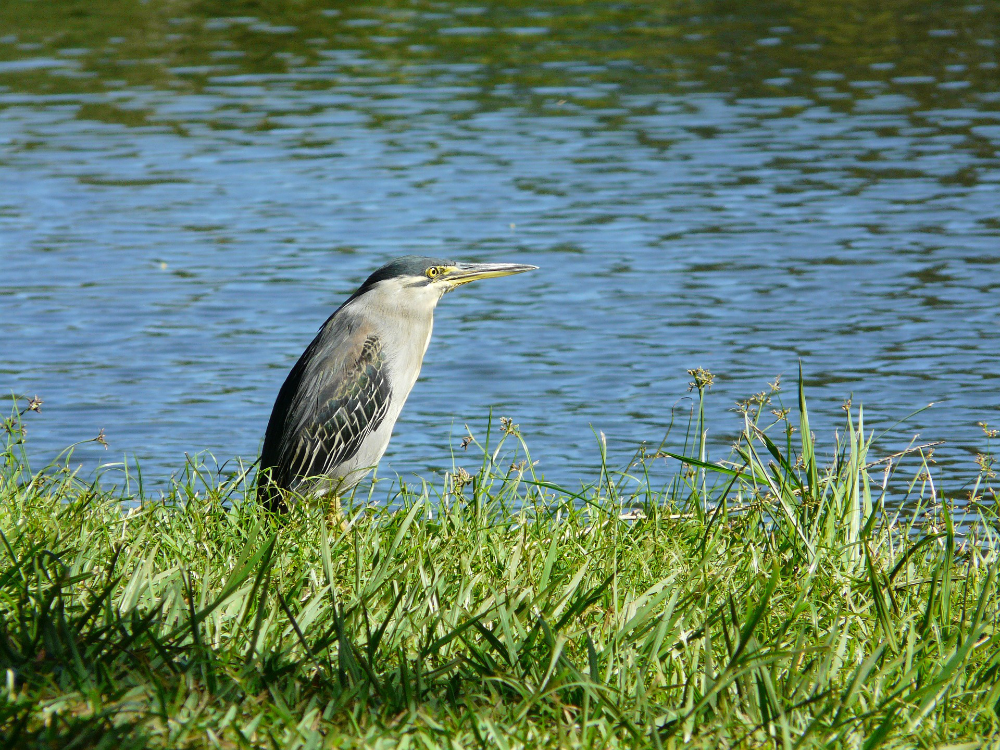

In [35]:
im

In [36]:
im.size

(1920, 1440)

In [0]:
# Converting image to grey Scale
image_gr = im.convert("L")

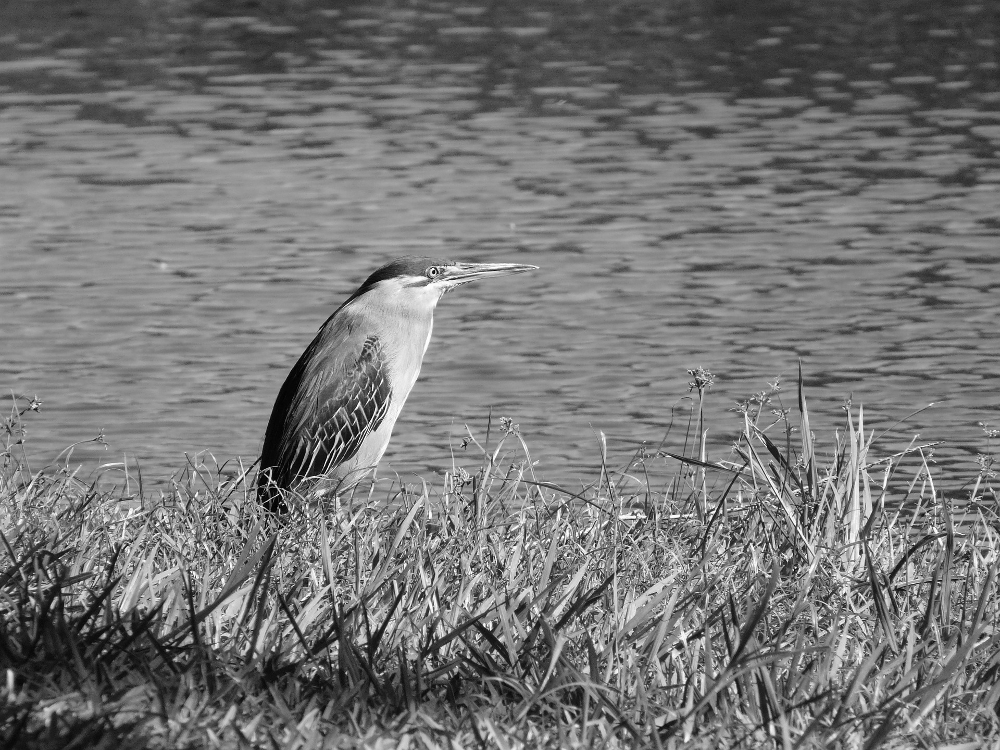

In [39]:
image_gr

In [40]:
image_gr.size

(1920, 1440)

In [0]:
# Convert image to a matrix with value form 0 to 255 
arr = np.array(image_gr)

In [42]:
arr

array([[ 64,  71,  64, ...,  49,  47,  48],
       [ 68,  71,  63, ...,  53,  52,  51],
       [ 65,  69,  65, ...,  54,  50,  55],
       ...,
       [ 21,  23,  22, ..., 184, 170, 154],
       [ 17,  20,  26, ..., 179, 165, 152],
       [ 26,  22,  21, ..., 170, 159, 148]], dtype=uint8)

In [43]:
arr.shape

(1440, 1920)

In [44]:
arr.size

2764800

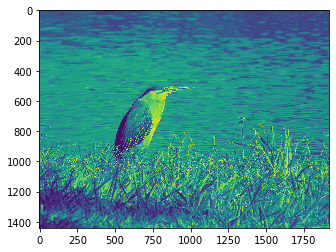

In [45]:
%matplotlib inline

imgplot = plt.imshow(arr)


 Input image converted to gray scale: 



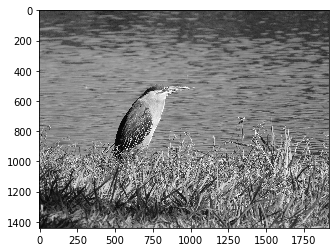

In [46]:
### Plot image

imgplot = plt.imshow(arr)
imgplot.set_cmap('gray')  # Can experiment different colormaps (Greys,winter,autumn)
print("\n Input image converted to gray scale: \n")
plt.show(imgplot)

In [0]:
#Defining the Kernel (with just any random kernel)

kernel = np.array([[0,1,2],
                   [2,3,4],
                   [1,0,4],])

grad = signal.convolve2d(arr, kernel, mode='full', boundary='symm')

In [49]:
grad

array([[1162, 1125, 1131, ...,  841,  829,  830],
       [1162, 1121, 1124, ...,  835,  819,  822],
       [1175, 1140, 1130, ...,  872,  854,  865],
       ...,
       [ 348,  344,  360, ..., 2904, 2720, 2624],
       [ 385,  392,  380, ..., 2820, 2654, 2571],
       [ 389,  403,  391, ..., 2804, 2642, 2561]])

In [52]:
# Now we will use edge detector kernel

kernel =  np.array([[ 0, 1, 0],
                   [ 1,-4, 1],
                   [ 0, 1, 0],]) 
y = signal.convolve2d(arr, kernel, mode='same', boundary='symm')
y

array([[ 11, -14,   7, ...,  -4,   8,   2],
       [ -4, -13,  12, ..., -14,  -7,   2],
       [ 10,  -5,   5, ...,  -7,  12,  -9],
       ...,
       [  3,  -1,   8, ..., -10,  -4,  19],
       [ 16,   8, -15, ...,  -8,   0,  11],
       [-13,   1,   5, ...,   8,   6,  15]])

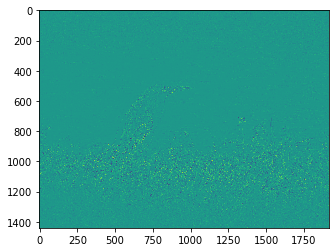

In [53]:
plt.imshow(y)

GRADIENT MAGNITUDE - Feature map


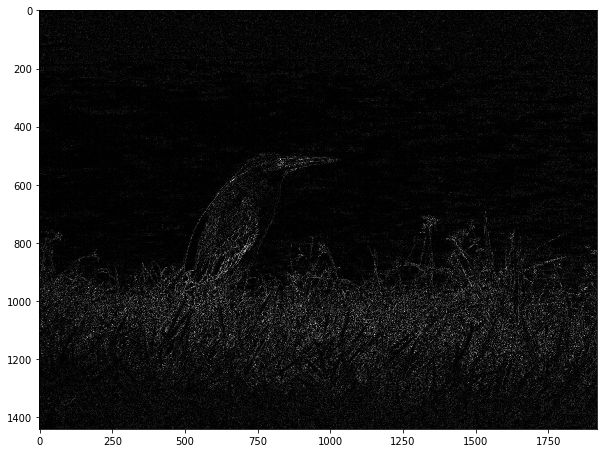

In [54]:
print('GRADIENT MAGNITUDE - Feature map')

fig, aux = plt.subplots(figsize=(10, 10))
aux.imshow(np.absolute(y), cmap='gray')

If we change the kernel and start to analyze the outputs we would be acting as a CNN. The difference is that a Neural Network do all this work automatically (the kernel adjustment using different weights). In addition, we can understand how biases affect the behaviour of feature maps

In [55]:
# On Normalize the pixel values.
arr.max()

255

In [56]:
arr.min()

0

In [57]:
arr

array([[ 64,  71,  64, ...,  49,  47,  48],
       [ 68,  71,  63, ...,  53,  52,  51],
       [ 65,  69,  65, ...,  54,  50,  55],
       ...,
       [ 21,  23,  22, ..., 184, 170, 154],
       [ 17,  20,  26, ..., 179, 165, 152],
       [ 26,  22,  21, ..., 170, 159, 148]], dtype=uint8)

In [0]:
arr = arr/255

In [59]:
arr

array([[0.25098039, 0.27843137, 0.25098039, ..., 0.19215686, 0.18431373,
        0.18823529],
       [0.26666667, 0.27843137, 0.24705882, ..., 0.20784314, 0.20392157,
        0.2       ],
       [0.25490196, 0.27058824, 0.25490196, ..., 0.21176471, 0.19607843,
        0.21568627],
       ...,
       [0.08235294, 0.09019608, 0.08627451, ..., 0.72156863, 0.66666667,
        0.60392157],
       [0.06666667, 0.07843137, 0.10196078, ..., 0.70196078, 0.64705882,
        0.59607843],
       [0.10196078, 0.08627451, 0.08235294, ..., 0.66666667, 0.62352941,
        0.58039216]])

Lets see how it works for a digit:

In [0]:
# download standard image
!wget --quiet https://ibm.box.com/shared/static/vvm1b63uvuxq88vbw9znpwu5ol380mco.jpg --output-document num3.jpg    

In [0]:
im = Image.open('num3.jpg')

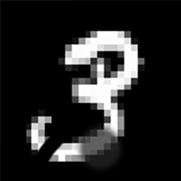

In [62]:
im

In [0]:

arr = np.array(im)

In [73]:
arr

array([[[26, 26, 26],
        [14, 14, 14],
        [12, 12, 12],
        ...,
        [11, 11, 11],
        [11, 11, 11],
        [11, 11, 11]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 1,  1,  1],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[12, 12, 12],
        [ 1,  1,  1],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       ...,

       [[12, 12, 12],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[12, 12, 12],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[12, 12, 12],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]]], dtype=uint8)

In [65]:
arr.shape

(181, 181, 3)

In [0]:
# this show that it in RGB format. So we need to convert it grey scale.

In [0]:
im_gr = im.convert("L")

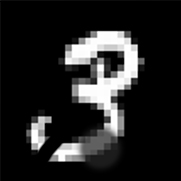

In [69]:
im_gr

In [0]:
arr2= np.array(im_gr)

In [71]:
arr2.shape

(181, 181)

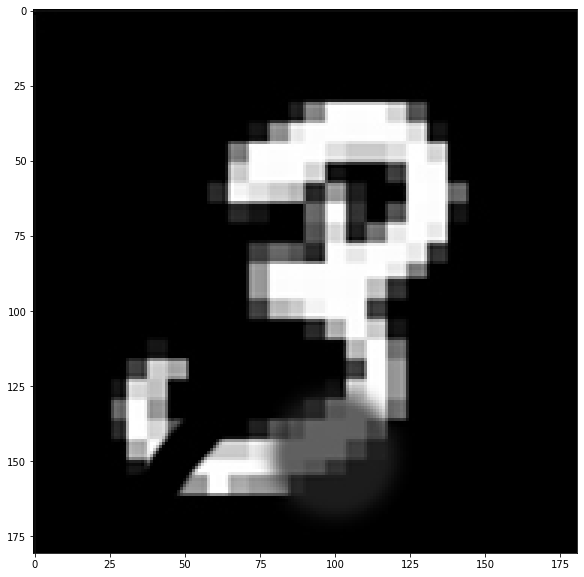

In [79]:
# ploting the image
fig, aux = plt.subplots(figsize=(10,10))

imgplot = plt.imshow(arr2)
imgplot.set_cmap('gray')

plt.show(imgplot)

In [81]:
kernel = np.array([
                        [ 0, 1, 0],
                        [ 1,-4, 1],
                        [ 0, 1, 0],
                                     ]) 

y2 = signal.convolve2d(arr2, kernel, mode='full', boundary='fill')
y2

array([[  0,  26,  14, ...,  11,  11,   0],
       [ 26, -90, -18, ..., -22, -33,  11],
       [  0,  38,  16, ...,  11,  11,   0],
       ...,
       [ 12, -24,  12, ...,   0,   0,   0],
       [ 12, -36,  12, ...,   0,   0,   0],
       [  0,  12,   0, ...,   0,   0,   0]])